### Загрузка графа

In [31]:
import json
full_friends = json.load(open("nodes.txt", "tr"))
full_graph = json.load(open("edges.txt", "tr"))
import networkx as nx
G = nx.Graph()
for i in full_friends["items"]:
    G.add_node(i["id"], name = i["first_name"]+" "+i["last_name"], sex = i["sex"])
my_friends = list(nx.nodes(G))
for i in my_friends:
    if "items" in full_graph[str(i)]:
        for j in full_graph[str(i)]["items"]:
            if j in my_friends:
                G.add_edge(i, j)



Функция отрисовки графа

In [48]:
%matplotlib inline
import matplotlib.pyplot as plt
def plot_graph(g, coloring = [], palette = plt.cm.Set2):
    with plt.xkcd():
        k = nx.degree(g)
        plt.figure(1, figsize=(60,45))
        coord = nx.kamada_kawai_layout(g)
#         labels={nd: g.nodes[nd]['name'] for (nd) in g.nodes()}
        if len(coloring)>0:
            nx.draw_networkx(g, pos=coord, nodelist=dict(k).keys(), node_size=[v*50 for v in dict(k).values()], 
                         font_size=17, node_color=coloring, cmap=palette)
        else:
            nx.draw_networkx(g, pos=coord, nodelist=dict(k).keys(), node_size=[v*50 for v in dict(k).values()], 
                         font_size=17)
            

Для начала оставим только самую большую компоненту связности.

In [51]:
largest_cc = max(nx.connected_components(G), key=len)
Gmain = G.subgraph(largest_cc)

#### Бисекция графа
Задача состоит в том, чтобы разделить граф на две части, так чтобы минимизировать число связей между этими частями. Полный перебор всех разделений неэффективен.

### Алгоритм Кернигана-Лина
Пусть у нас уже есть две компоненты, рассмотрим все возможные пары вершин и посмотрим, станит ли разделение лучше, если мы поменяем две вершины местами. Алгоритм Кернигана-Лина может быть обобщен и более чем на две компоненты.

По умолчанию граф делится на две равные части. Также ему можно задать начальное разделение.

In [9]:
InitialTwoParts = [set(list(Gmain.nodes)[:100]), set(list(Gmain.nodes)[100:])]

In [10]:
from networkx.algorithms import community
TwoParts2 = community.kernighan_lin_bisection(Gmain, InitialTwoParts)
coloring2 = [0 if x in TwoParts2[0] else 1 for x in Gmain.nodes]

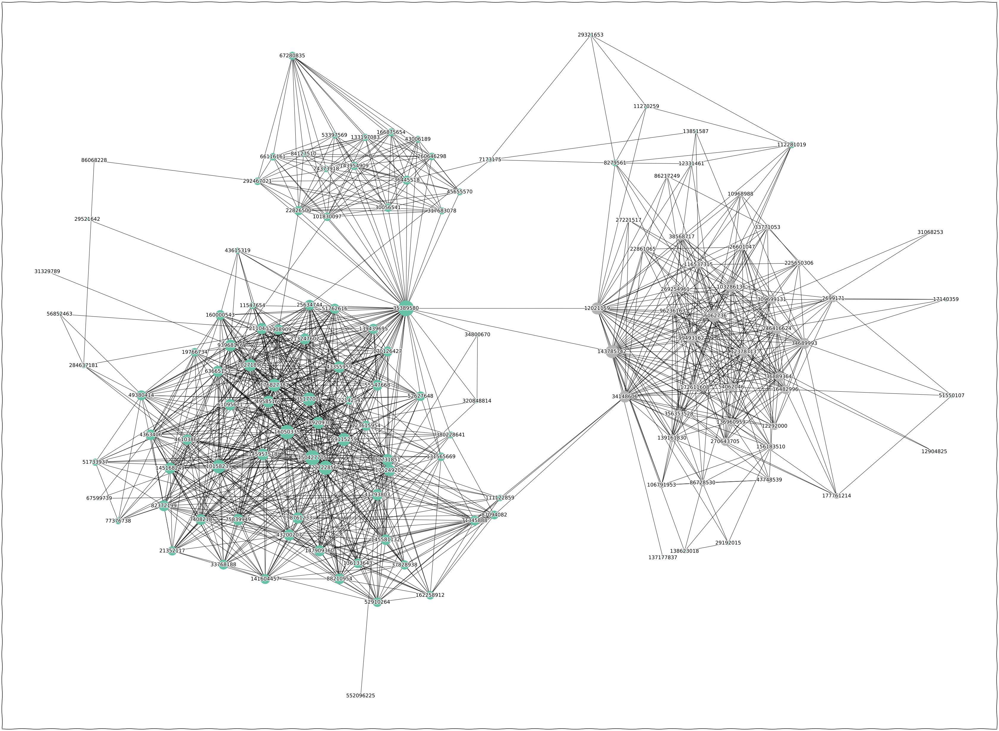

In [11]:
plot_graph(Gmain, coloring2)

### Спектральное разделение
Построим Лапласиан для графа: $L = D - A$, где $D$ - диагональная матрица степеней вершин, а $A$ - матрица смежности.

In [12]:
import numpy as np
import numpy.linalg as la
A = nx.adjacency_matrix(Gmain)
D = np.diag(np.ravel(np.sum(A,axis=1)))
L=D-A
l, U = la.eigh(L)
f = U[:,1]

Мы нашли собственный вектор соотвествуйщий второму по величине собственному числу Лапласиана. При этом если нам нужно выделить компоненту фиксированного размера $n$, то мы возьмем вершины с наибольшим или наименьшим значением в собственном векторе. Если размер заранее не задан, то можно посмотреть на знак. 

In [13]:
spectral_coloring = np.ravel(np.sign(f))

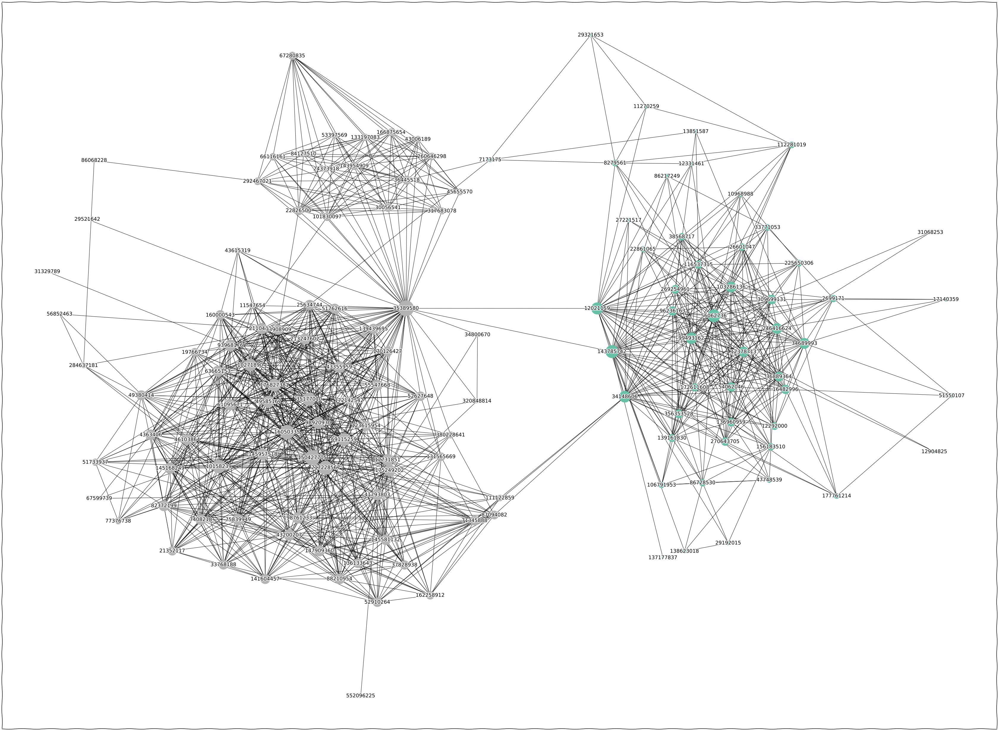

In [14]:
plot_graph(Gmain, spectral_coloring)

### Алгоритмы кластеризации
Если, же нам нужно получить больше компонент, то рекомендуется использовать кластеризацию, например kmeans на значениях k собственных векторов, соответствующих наименьшим собственным числам, начиная со второго. На практике с этим иногда бывают проблеммы, так как в отдельные кластеры могут выделяться отдельные вершины, лежащие "в стороне".

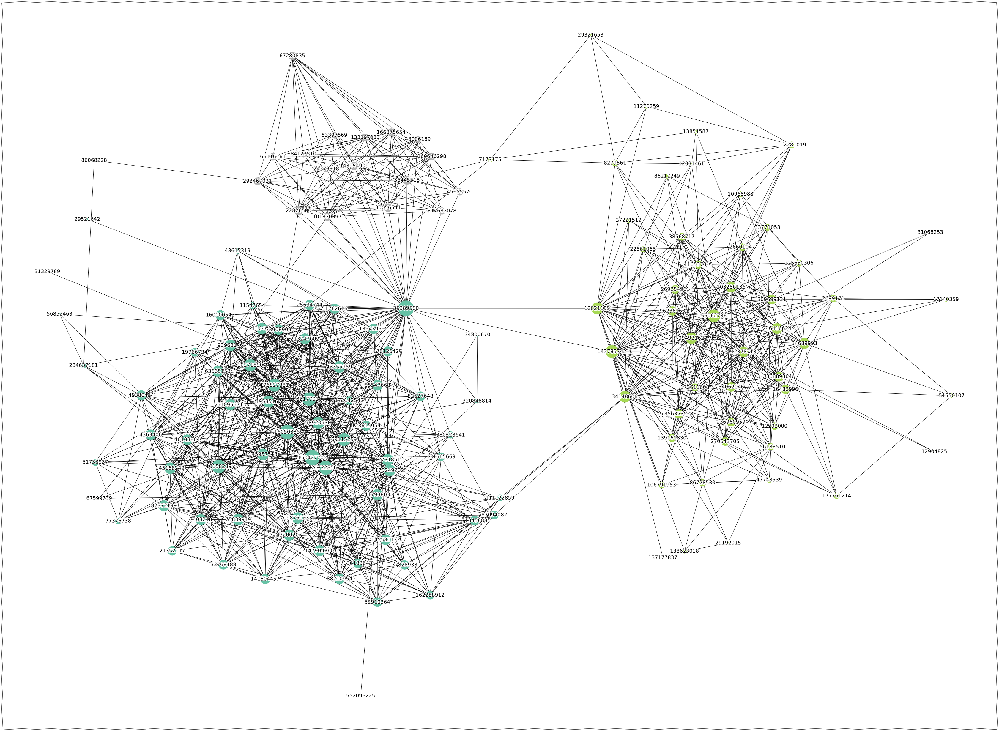

In [19]:
import scipy.cluster.vq as vq

k=3
means, labels = vq.kmeans2(U[:,1:k], k)
plot_graph(Gmain, labels)

### k-clique community
Давайте считать вершины лежащими в одной компоненте, если они принадлежжат одной клике заданного размера.

In [20]:
clique_components = list(community.k_clique_communities(Gmain, 6))

In [21]:
def get_colors(G, comp):
    d={}
    c = 0
    for i in comp:
        c+=1
        for v in i:
            d[v]=c
    res = []
    for v in G.nodes:
        if v in d: res.append(d[v])
        else: res.append(0)
    return(res)

In [22]:
clique_col = get_colors(Gmain, clique_components)

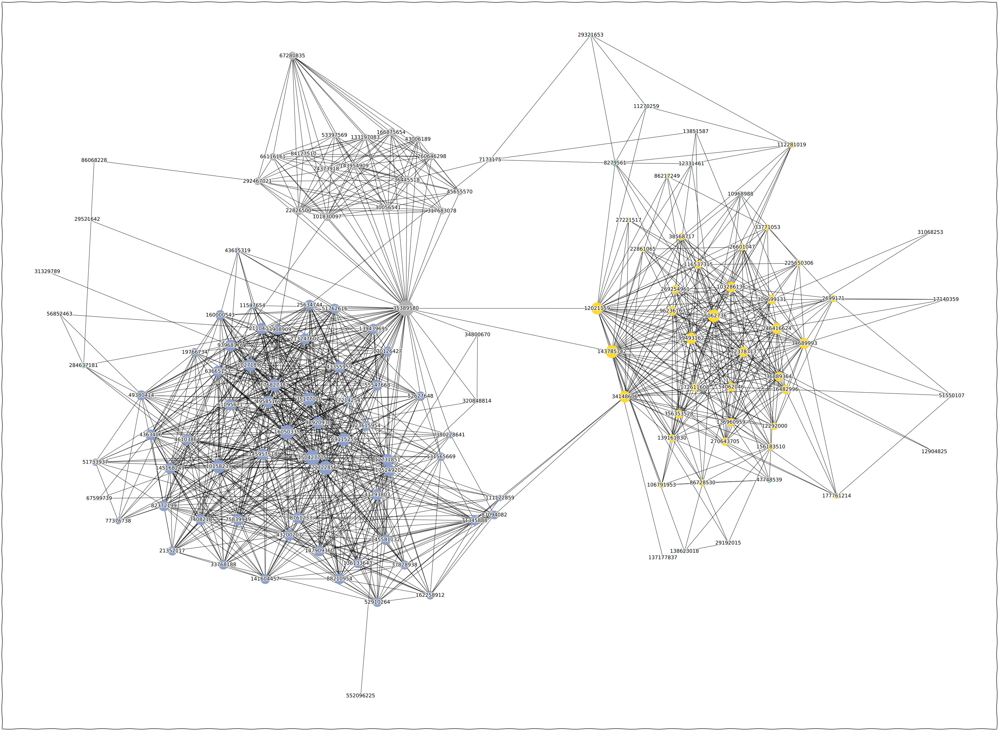

In [23]:
plot_graph(Gmain, clique_col)

### Алгоритм Girvan-Newman

Выделение комьюнити на основе выкидывания "центральных ребер".
Центральность по посреднечеству можно считать не только для вершин, но и для ребер.
Самые центральные ребра это те, через которые проходит наибольшее число путей. Давайте выкидывать самые популярные ребра и смотреть на компоненты связности.

In [24]:
gnc = community.girvan_newman(Gmain)

Обратите внимание, что мы получили генератор. Реально выкидывание ребер будет происходить только, когда мы будем к нему обращаться. При этом каждый раз мы будем получать но одну больше компонент связности.  

In [25]:
gnc_set2 = next(gnc)
gnc_color2 = get_colors(Gmain, gnc_set2)

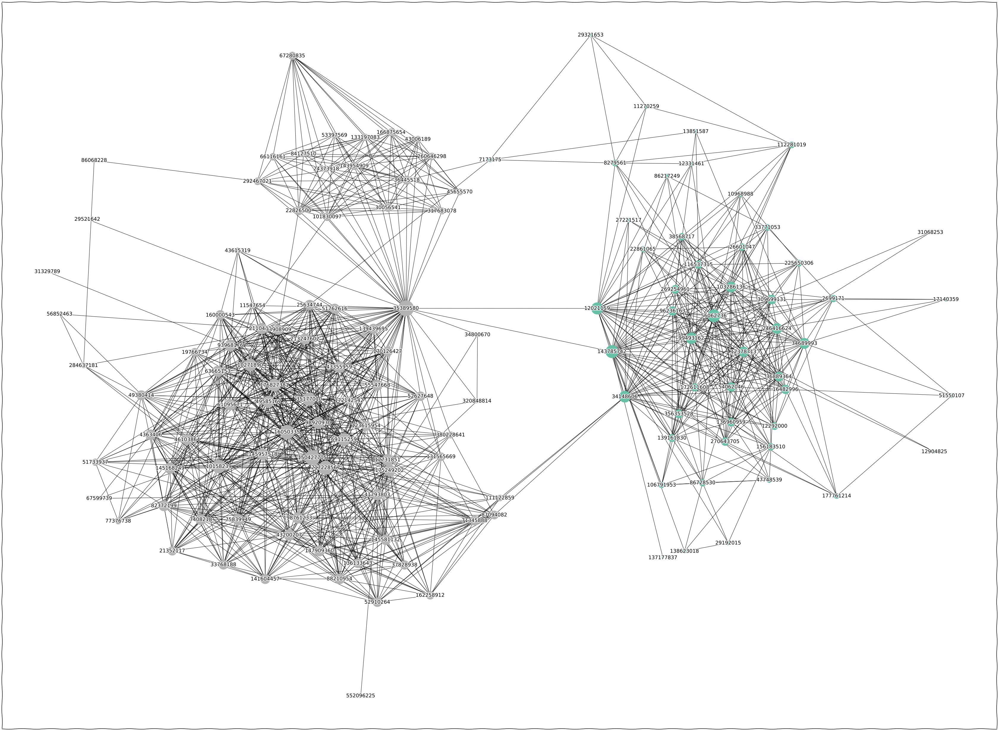

In [26]:
plot_graph(Gmain, gnc_color2)